- Credits:
- few images are taken from Sebastian Raschka blog

# What is Pytorch
- Pytorch is tensor-library, Automatic differentiation engine, Deep learning library
- library that allows you to do deep-learning, training and fine-tuning a model

## Tensor-library
- tensor library generalisation of
  1. scalar
  2. matrix
  3. vector
- scalar is a rank-0 tensor that doesn't have a dimension
- vector is a rank-1 tensor that has 1D (1 dimension) or 1 row and multipl columns
- matrix is a rank-2 tensor (2 dimension) or 2 rows and multiple columns

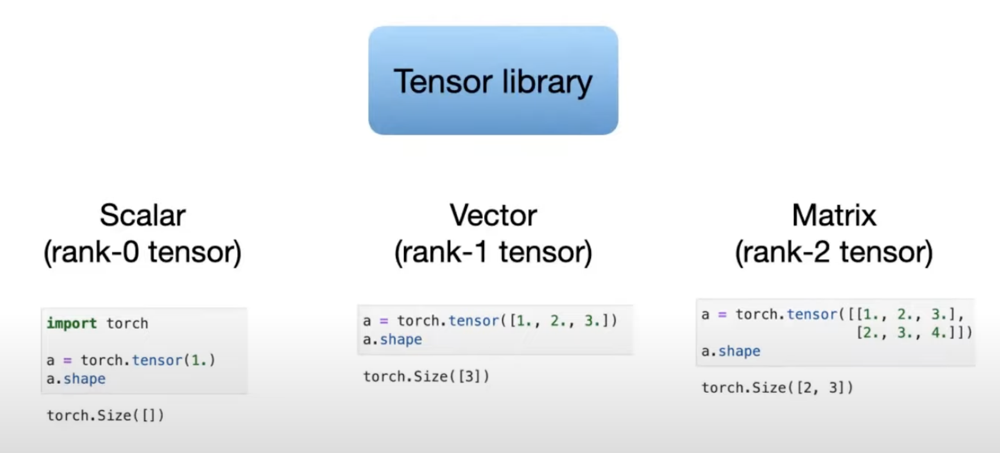

- A tensor library is essentially an array-library
```
torch.tensor ~ numpy.array
```
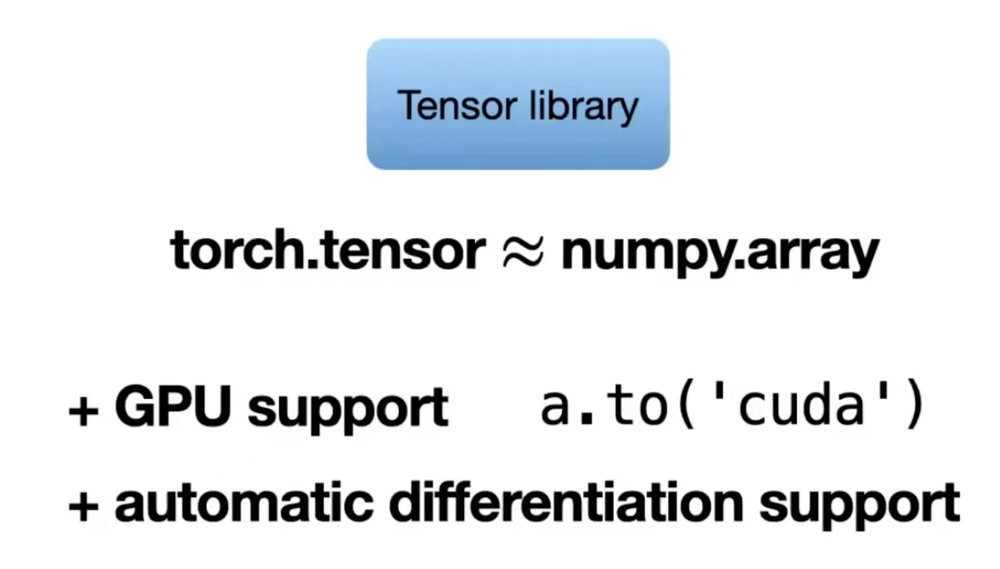

- PyTorch is a relatively comprehensive library, and one way to approach it is to focus on its three broad components, which are summarized in Figure 1.

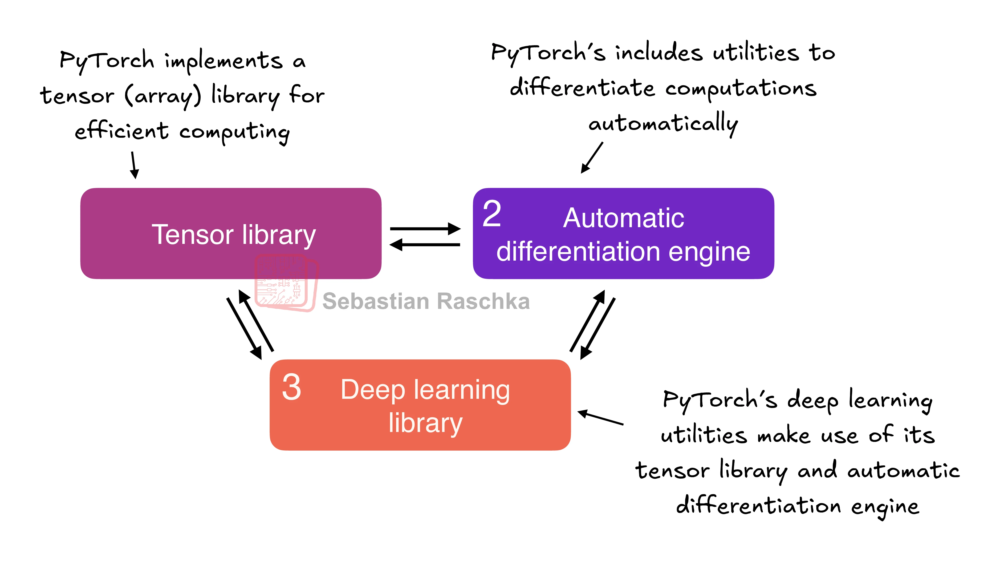



In [1]:
!pip3 install jedi --upgrade


[notice] A new release of pip is available: 24.0 -> 25.1.1
[notice] To update, run: pip install --upgrade pip


In [2]:
!pip3 install torch pandas matplotlib seaborn scikit-learn tqdm


[notice] A new release of pip is available: 24.0 -> 25.1.1
[notice] To update, run: pip install --upgrade pip


### Scalars, vectors, matrices, and tensors 

In [6]:
import torch

# 0D tensor always contain single element or value
# shape property prints empty tensor representing it has no dimension and just a scalar value
scalar_0D_Tensor = torch.tensor(1)

print(f"0 dimensional tensor (scalar) ", scalar_0D_Tensor.shape)

# 1D tensor(vector) always treated as a list of elements of same type
# shape is same as number of elements in the vector
# shape is always printed as (n,) where n is number of elements in the vector
vector_1D_1Row_Tensor = torch.tensor([1, 2, 3])

print(f"1 dimensional tensor (vector)", vector_1D_1Row_Tensor.shape)


# 2D tensor (matrix) is a mix of rows and columns
# shape is printed as (m , n) where m is number of rows in matrix and n is number of columns in matrix
matrix_2D_m_Rows_n_Columns = torch.tensor([ [1, 2, 3] , [4, 5, 6] ])

# matrix with 2 rows and 3 columns (m = 2, n = 3)
print(f"2 dimensional tensor (matrix)", matrix_2D_m_Rows_n_Columns.shape)


# Define a 3D tensor
  # Outermost list: 2 elements (for the 2 "slices")
    # Each element is a 2D matrix (list of lists)
      # Each 2D matrix has 3 rows (inner lists)
        # Each row has 2 columns (numbers)

tensor_3d_example1 = torch.tensor([
    [  # This is the 1st layer (index 0)
       # Slice 0
        [1, 2],    # Row 0
        [3, 4],    # Row 1
        [5, 6]     # Row 2
    ],
    [  # This is the 2nd layer (index 1)
       # Slice 1
        [7, 8],   # Row 0
        [9, 10],  # Row 1
        [11, 12]  # Row 2
    ]
])

print("Tensor 3D Example 1:")
print(tensor_3d_example1)
print(f"Shape: {tensor_3d_example1.shape}")
print(f"data-type", tensor_3d_example1.dtype)

0 dimensional tensor (scalar)  torch.Size([])
1 dimensional tensor (vector) torch.Size([3])
2 dimensional tensor (matrix) torch.Size([2, 3])
Tensor 3D Example 1:
tensor([[[ 1,  2],
         [ 3,  4],
         [ 5,  6]],

        [[ 7,  8],
         [ 9, 10],
         [11, 12]]])
Shape: torch.Size([2, 3, 2])
data-type torch.int64


In [16]:
# Pytorch multiplication

# Define a Matrix 2D tensor and then transpose it and then multiply the original 2D tensor with the transposed tensor
# tensor-1: 

# 3 rows and 2 columns
matrix_original = torch.tensor( [[1, 2], [3, 4], [5, 6]] )
print(f"matrix_original matrix:", matrix_original)
print(f"original matrix has shape:", matrix_original.shape)

print(f"\n")

# after transpose of original matrix, it will have 2 rows and 3 columns
matrix_transposed = matrix_original.T
print(f"transposed matrix:", matrix_transposed)
print(f"transposed matrix has shape:", matrix_transposed.shape)

print(f"\n")

# after multiplication of original and transposed matrices, it will have 3 rows and 3 columns
matrix_product = torch.matmul(matrix_original, matrix_transposed)
print(f"matrix_product matrix:", matrix_product)
print(f"matrix_product matrix has shape:", matrix_product.shape)


matrix_original matrix: tensor([[1, 2],
        [3, 4],
        [5, 6]])
original matrix has shape: torch.Size([3, 2])


transposed matrix: tensor([[1, 3, 5],
        [2, 4, 6]])
transposed matrix has shape: torch.Size([2, 3])


matrix_product matrix: tensor([[ 5, 11, 17],
        [11, 25, 39],
        [17, 39, 61]])
matrix_product matrix has shape: torch.Size([3, 3])


## Automatic differentiation Engine

### What is this used for??
1. A logistic regression model
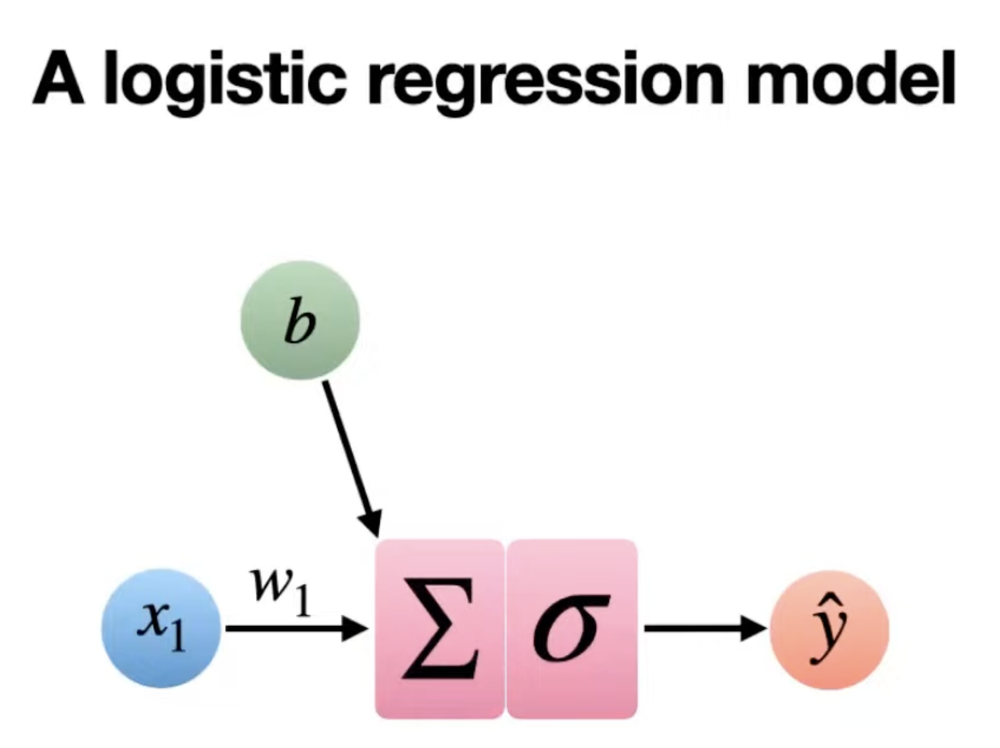

- point is about how do we take a model and perform regression
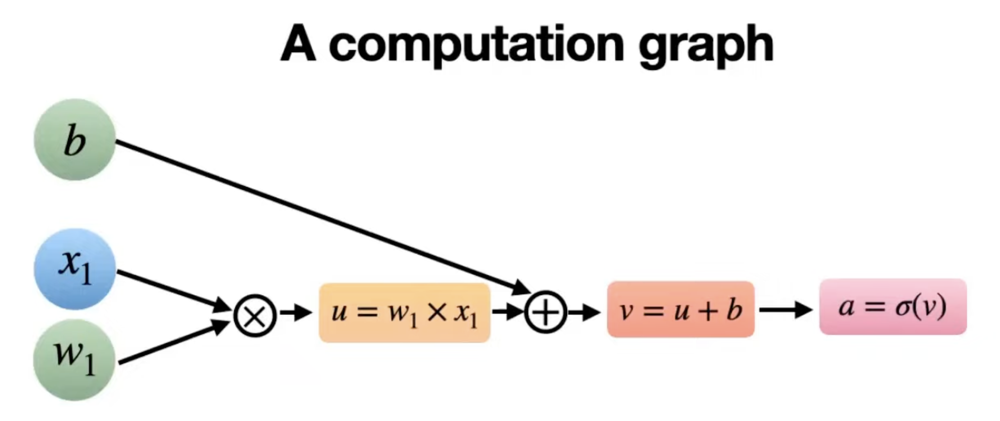


### What is Sigmoid function

- It squashes any number into a value between 0 and 1.

$$\text{sigmoid}(x) = \frac{1}{1 + e^{-x}}$$

🧠 Why is this used?

Because:
- It turns your result into a probability-like value
- Commonly used in neural networks, especially:
   - For binary classification
   - As the activation function for a neuron

📌 In your example:

```python
v = (weight * input) + bias = 0.16
a = sigmoid(v) ≈ 0.54
```

- You can think of it like this:
- You’re building a tiny artificial neuron:
   - It multiplies input with a weight
   - Adds a bias
   - Passes the result through sigmoid
   - Which gives an output between 0 and 1

🧪 Where is sigmoid used?

| Use Case | Why |
| -| -|
| Binary classification | To give a probability (e.g., is this image a cat?)
| Neural networks | Activation function in simple models |
| Logistic regression | Core idea behind prediction |

🧠 Easy analogy:

- Think of sigmoid like a dimmer switch — no matter how big or small your input is, it compresses it between 0 and 1 smoothly.

- Let me know if you’d like a visual graph or a neural net explanation using diagrams.


In [25]:
import torch

The history saving thread hit an unexpected error (OperationalError('attempt to write a readonly database')).History will not be written to the database.


In [10]:
bias = torch.tensor(0.1)

tensor(0.1000)

In [15]:
print(bias.shape)

torch.Size([])


In [26]:
weight = torch.tensor(0.3, requires_grad=True)

In [27]:
input0 = torch.tensor(0.2)

In [28]:
u = weight * input0

In [29]:
v = u + bias

In [30]:
print(v)

tensor(0.1600, grad_fn=<AddBackward0>)


In [31]:
a = torch.sigmoid(v)

In [32]:
print(a)

tensor(0.5399, grad_fn=<SigmoidBackward0>)


### Deep Learning Library demo

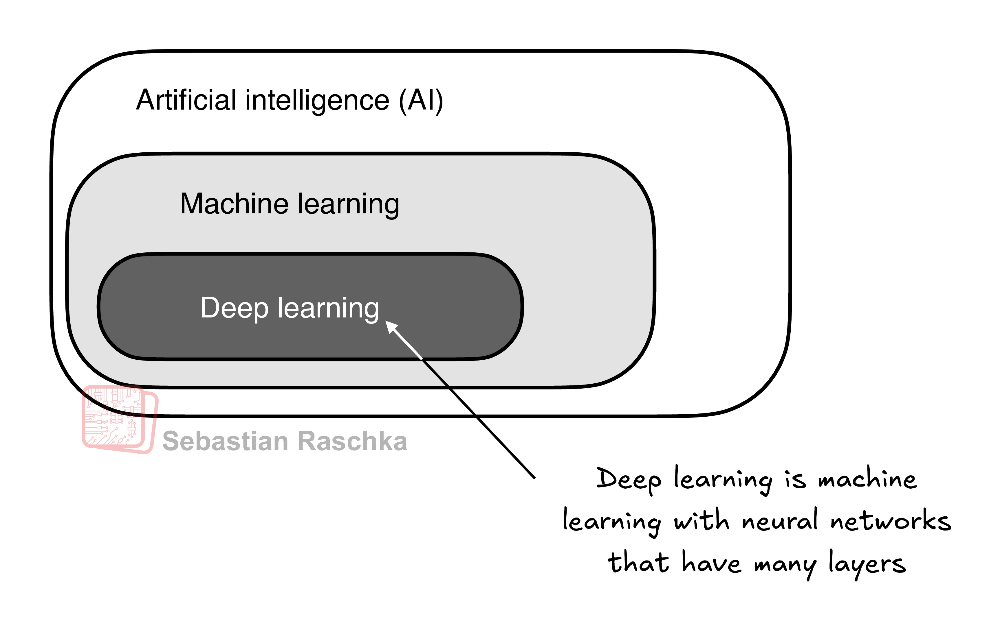

The typical predictive modeling workflow (also referred to as supervised learning) in machine learning and deep learning is summarized in above figure

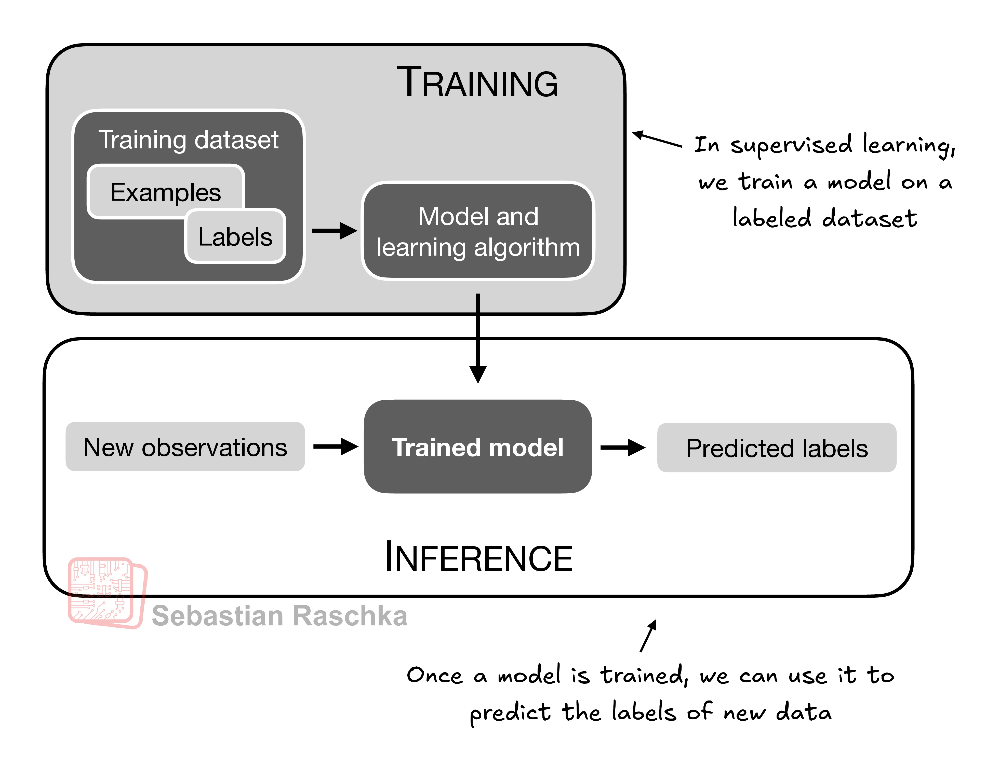


Neural network training in 3 Steps:

- Step-1: Defining the model
- Step-2: Defining the dataset
- Step-3: Defining the training loop



In [33]:
import torch
torch.__version__

'2.7.1'

In [35]:
import torch
torch.cuda.is_available()

False

In [36]:
print(torch.backends.mps.is_available())

True


In [31]:
import torch.nn.functional as F
import torch
import torch.optim as optim

# input_feature -> input_data (or feature_x)
input_data = torch.tensor([1.1])

# expected_output_feature -> target_label (or ground_truth)
target_label = torch.tensor([1.0])

# weight -> weight (or parameter_w) - "weight" is already good
weight = torch.tensor([2.2], requires_grad=True)
# bias -> bias (or parameter_b) - "bias" is already good
bias = torch.tensor([0.0], requires_grad=True)

# --- Create the Optimizer ---
optimizer = optim.SGD([weight, bias], lr=0.01)

# net_input -> pre_activation (or logit_z)
pre_activation = weight * input_data + bias
print(f"pre_activation (z) is: ", pre_activation)
print(f"pre_activation (z) has shape: ", pre_activation.shape)

# activation_output -> activation (or predicted_probability)
activation = torch.sigmoid(pre_activation)
print(f"activation (a) is: ", activation)
print(f"activation (a) has shape: ", activation.shape)

# loss -> loss (or current_loss)
loss = F.binary_cross_entropy(activation, target_label)
print(f"loss is: ", loss)
print(f"loss has shape: ", loss.shape)

# =========================================================================
# Outputs after Backward Propagation (loss.backward())
# =========================================================================

# Initial gradients before backward pass (will be None or zeros if previously zeroed)
print("\n--- Before backward() ---")
print(f"weight.grad: {weight.grad}")
print(f"bias.grad: {bias.grad}")


loss.backward() # Computes gradients of loss w.r.t. parameters (weight, bias)

print("\n--- After loss.backward() ---")
# The gradients are now stored in the .grad attribute of the parameters
# These are the values the optimizer will use to update the parameters
print(f"weight.grad: {weight.grad}")
print(f"bias.grad: {bias.grad}")

# =========================================================================
# Outputs after Optimizer Step (optimizer.step())
# =========================================================================

# Parameters' values before optimizer.step()
print("\n--- Before optimizer.step() ---")
print(f"weight value: {weight.item():.4f}") # .item() extracts scalar value
print(f"bias value: {bias.item():.4f}")

optimizer.step() # Updates parameters using these gradients

print("\n--- After optimizer.step() ---")
# The parameter values themselves have changed
print(f"Updated weight value: {weight.item():.4f}")
print(f"Updated bias value: {bias.item():.4f}")

# IMPORTANT: Gradients are NOT automatically zeroed after optimizer.step()
# They still hold the values from the last backward pass.
print(f"weight.grad (still holds values): {weight.grad}")
print(f"bias.grad (still holds values): {bias.grad}")


# =========================================================================
# Outputs after Resetting Optimizer Gradients (optimizer.zero_grad())
# =========================================================================

optimizer.zero_grad() # Clears gradients for next iteration

print("\n--- After optimizer.zero_grad() ---")
# The .grad attributes of the parameters should now be None or tensors of zeros
print(f"weight.grad (should be None/zeros): {weight.grad}")
print(f"bias.grad (should be None/zeros): {bias.grad}")

pre_activation (z) is:  tensor([2.4200], grad_fn=<AddBackward0>)
pre_activation (z) has shape:  torch.Size([1])
activation (a) is:  tensor([0.9183], grad_fn=<SigmoidBackward0>)
activation (a) has shape:  torch.Size([1])
loss is:  tensor(0.0852, grad_fn=<BinaryCrossEntropyBackward0>)
loss has shape:  torch.Size([])

--- Before backward() ---
weight.grad: None
bias.grad: None

--- After loss.backward() ---
weight.grad: tensor([-0.0898])
bias.grad: tensor([-0.0817])

--- Before optimizer.step() ---
weight value: 2.2000
bias value: 0.0000

--- After optimizer.step() ---
Updated weight value: 2.2009
Updated bias value: 0.0008
weight.grad (still holds values): tensor([-0.0898])
bias.grad (still holds values): tensor([-0.0817])

--- After optimizer.zero_grad() ---
weight.grad (should be None/zeros): None
bias.grad (should be None/zeros): None


## Plantuml syntax for pytorch:

![plantuml-sequence](https://www.plantuml.com/plantuml/png/VLFjRkCs4FolfzZcJsNNfmSmSCMrINqu84M2slrHe82nbbOsKOfKboixpjEN5CN8B2u1R41Spkp7xF2B4sGPEbty82Vg27gDoXI5AD44pzUTvVe4MsME_hXZV-S_OIlKGtblJKsz3AXXe-rbKHHOYsMu-yiEK3xGcRJjYHTtW0xyiUYHHTMgHoDmzytqWy032aBv4Z5ZA4Vja8yay8W7qb1U8ou6S-0pCdOan0xA2wdZILPmKEWYOxnrEUDtsv26UzJre56KDPufuxYsdsWZvAd_7_6NMjHvPC1cCFNuKMugfuwTLKraRkCX9pvQvpBAGHdawxvcVx4d8spxQSG0tPYS_jIBwjGhCPGsV5RRhmyH_NPJ55vd-FGpH7NNNlPM6G8LZljc4Zk1eeupIiRpNYUn4owgD-DkzOMIwTz1CRdzaR7vlEE1teXpnslVaHCqeb08x3n9ZyvHMf2taB7X_amS7BEQCwnXkTm6hu9juSdScF6R46DKbAfZjOBMCY0SKEhJOhailjFCt43b_tRil5p4sXncMyEz9cG7LZSGRXKPST2oxQPMgn0jYXzXO_c2tFYmSwbKyWsit_n5q3FjSRPE-GgV9oLX2I_mKxHhaRW-Jt8HhCViy5gaG5xZ3vA13TmcnqMQUx9IrehseVVyL-8AhejSZDr9EV0_EH6qqxnXSL3FhmTi6-vZxZFgWQeWpwzO_vFfaxKKmDLXWgGDQ6f3JL_xIEm01x51R10BjUsyaMbUIVMt-JfzWpA-jousqsfxSH0onwLD5SMczHLJvDEjl__i6nIwtN3oL5pK68g-7pzpbL8Z3f09ZBs04ylKW38Gaw48gyCWvC2sgOnNANapzhuLwZyshVE8tAytG2PiN3O3cWQ6SRGKZmlojMTQ9eGtbsgl-KEFb8zVw6-cUVzz-hVuXKmpTFe_)

## Implementing Multilayer neural networks

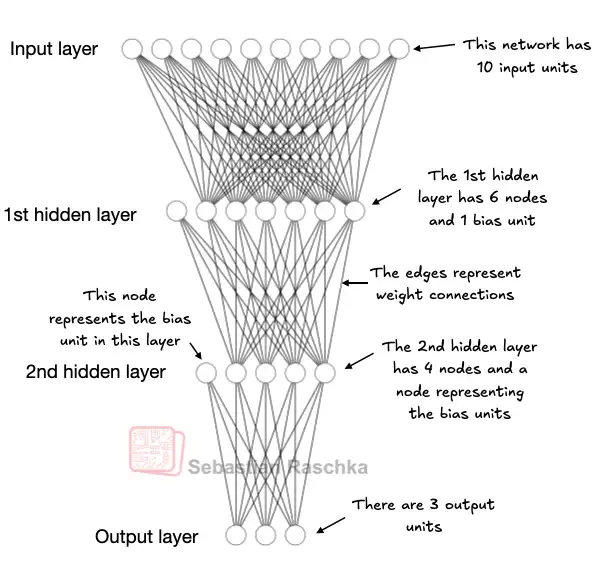

## nn module
- layer(s) in the multi-layer perceptron is built from `torch.nn.Module`
- `torch.nn.Module` is inherited by the MultiLayePerceptron Class
- sequential layers are constructed and initialised inside this MultiLayerPerceptron

## MultiLayerPerceptron initialisation
- the __init__ function in MultiLayerPerceptron initializes its super class `torch.nn.Module`
- This Module base class provides a lot of functionality, making it easier to build and train models.
- For instance, it allows us to encapsulate layers and operations and keep track of the model’s parameters.

In [43]:
import torch
import torch.nn as nn # <--- Standard alias for torch.nn

class MultiLayerPerceptron(nn.Module):
  def __init__(self, num_inputs, num_outputs):
      super().__init__()
      self.layers = nn.Sequential(

          # 1st hidden layer
          torch.nn.Linear(num_inputs, 30),
          torch.nn.ReLU(),


          # 2nd hidden layer
          torch.nn.Linear(30, 20),
          torch.nn.ReLU(),

          # output layer
          torch.nn.Linear(20, num_outputs),
      )

  # forward method describes how the input data passes through the network and comes together as a computation graph
  def forward(self, input_data):
      logits = self.layers(input_data)
      return logits

In [47]:
num_of_inputs = 50
num_of_outputs = 3
model = MultiLayerPerceptron(num_of_inputs, num_of_outputs)

In [45]:
print(model)

MultiLayerPerceptron(
  (layers): Sequential(
    (0): Linear(in_features=50, out_features=30, bias=True)
    (1): ReLU()
    (2): Linear(in_features=30, out_features=20, bias=True)
    (3): ReLU()
    (4): Linear(in_features=20, out_features=3, bias=True)
  )
)


In [51]:
num_of_trainable_parameters = sum(p.numel() for p in model.parameters() if p.requires_grad)

In [52]:
print(f"number of trainable parameters in MultiLayerPerceptron Model is:", num_of_trainable_parameters)

number of trainable parameters in MultiLayerPerceptron Model is: 2213


## Logic to get total number of trainable parameters

### model initialisation inputs:
1. x_input_features: 50
2. y_output_features: 3

### layer inputs:
1. Layer-1: `x_input_features * layer_1_output_features`
2. Layer-2: `layer_1_output_features * layer_2_output_features`
3. Layer-3: `layer_2_output_features * layer_2_output_features`

- As per the model class (MultiLayerPerceptron)
  - layer_1_output_features: 30
  - layer_2_output_features: 20
  - bias size at each layer gets defaulted to the output_features of that layer
  - bias_layer_1 = layer_1_output_features = 30
  - bias_layer_1 = layer_2_output_features = 20
  - bias_layer_3 = layer_3_output_features = 3

```
total_number_of_trainable_parameters = 
(x_input_features * layer_1_output_features + bias_layer_1) +
(layer_1_output_features * layer_2_output_features + bias_layer_2) +
(layer_2_output_features * layer_2_output_features  + bias_layer_3)
```

total_number_of_trainable_parameters = (50 * 30 + 30) + (30 * 20 + 20) + (20 * 3 + 3) = 1530 + 620 + 63 =  2213

## Parameter initialisation
- these parameters are initialized with random values by default (specifically, using Kaiming Uniform initialization for weight and uniform distribution for bias by default in PyTorch, though the exact method can vary)
- This is why you see seemingly random numbers when you print model.layers[0].weight.

In [61]:
print(f"model.layers[0].weight.shape is: ", model.layers[0].weight.shape)
print(f"model.layers[0].bias.shape is: ", model.layers[0].bias.shape)

print(f"model.layers[1].weight.shape is: ", model.layers[2].weight.shape)
print(f"model.layers[1].bias.shape is: ", model.layers[2].bias.shape)

print(f"model.layers[2].weight.shape is: ", model.layers[4].weight.shape)
print(f"model.layers[2].bias.shape is: ", model.layers[4].bias.shape)

model.layers[0].weight.shape is:  torch.Size([30, 50])
model.layers[0].bias.shape is:  torch.Size([30])
model.layers[1].weight.shape is:  torch.Size([20, 30])
model.layers[1].bias.shape is:  torch.Size([20])
model.layers[2].weight.shape is:  torch.Size([3, 20])
model.layers[2].bias.shape is:  torch.Size([3])


## Weight dimension for each layer

- for Linear(in_features=50, out_features=30):
   - The weight matrix will have 30 rows and 50 columns.
   - The reason for this shape is how matrix multiplication is typically performed in linear algebra and implemented in PyTorch:
      1. Input Shape: If your input x has in_features (e.g., 50), its shape is (batch_size, in_features).
      2. Weight Shape: The weight matrix W has the shape (out_features, in_features).

<br/>

- Multiplication: The operation is effectively `output = x @ W.T + bias` OR  `output = x @ W_transposed + bias`
   - where W_transposed has shape (in_features, out_features)) or more commonly for PyTorch's nn.
   - Linear it is structured such that `output = input @ W^T + bias` where `W is (out_features, in_features)`.

So, to reiterate, for Linear(in_features=X, out_features=Y), the weight matrix has shape (Y, X).

## Random value generation

- we want to keep using small random numbers as initial values for our layer weights, 
- we can make the random number initialization reproducible by seeding PyTorch’s random number generator via manual_seed

if you call torch.manual_seed(123) once at the very beginning of your script, it sets the seed for PyTorch's CPU random number generator. This means it will affect all subsequent operations in PyTorch that rely on randomness on the CPU.

This includes:

 1. Parameter Default Initialization:

    - When you instantiate layers like `torch.nn.Linear` or `torch.nn.Conv2d`, their weights and biases are automatically initialized with random values. Setting `torch.manual_seed()` ensures these initial random values are the same every time you run your code.

 2. Any Other PyTorch Random Function Calls:

    - If you explicitly use PyTorch functions that generate random numbers, such as:
       - `torch.rand()`
       - `torch.randn()`
       - `torch.randint()`
       - `torch.randperm()`
       - Operations involving torch.dropout layers (during training)

     - These will also produce the same sequence of "random" numbers across runs, provided the seed is set.

### Regarding "input feature random generation":

 - If your input_feature (or x1 as in some of your examples) is generated using a PyTorch random function (e.g., input_data = torch.randn(1)), then torch.manual_seed() would indeed make that input generation reproducible.

 - However, in your specific example `input_data = torch.tensor([1.1])`, you're defining a fixed tensor, not a randomly generated one. So, in that specific case, `torch.manual_seed()` wouldn't change the input_data itself because it's deterministic.

 - But if you were loading random data or applying random augmentations, the seed would apply.

### Important Consideration for GPU (CUDA):

If you are using a GPU for training (i.e., your tensors are on CUDA devices), you also need to set a separate seed for PyTorch's CUDA random number generator for full reproducibility:

```python
import torch
import numpy as np
import random

# For CPU operations
torch.manual_seed(123)

# For GPU operations (if you are using CUDA)
if torch.cuda.is_available():
    torch.cuda.manual_seed(123)
    torch.cuda.manual_seed_all(123) # For multi-GPU setups

# For Python's built-in random module
random.seed(123)

# For NumPy operations (often used in data preprocessing)
np.random.seed(123)
```

In [79]:
# verify the model with sample random data
import torch
torch.manual_seed(123)
X = torch.rand((1, 50))
print(X)
Y = model(X)
print(Y)
output_logits_tensors = torch.softmax(Y, dim=1)
print(f"output_logits_tensors are: ", output_logits_tensors)

tensor([[0.2961, 0.5166, 0.2517, 0.6886, 0.0740, 0.8665, 0.1366, 0.1025, 0.1841,
         0.7264, 0.3153, 0.6871, 0.0756, 0.1966, 0.3164, 0.4017, 0.1186, 0.8274,
         0.3821, 0.6605, 0.8536, 0.5932, 0.6367, 0.9826, 0.2745, 0.6584, 0.2775,
         0.8573, 0.8993, 0.0390, 0.9268, 0.7388, 0.7179, 0.7058, 0.9156, 0.4340,
         0.0772, 0.3565, 0.1479, 0.5331, 0.4066, 0.2318, 0.4545, 0.9737, 0.4606,
         0.5159, 0.4220, 0.5786, 0.9455, 0.8057]])
tensor([[0.0995, 0.0644, 0.0050]], grad_fn=<AddmmBackward0>)
output_logits_tensors are:  tensor([[0.3478, 0.3358, 0.3164]], grad_fn=<SoftmaxBackward0>)


## `grad_fn`: The Back-Reference for Gradients

When you see `grad_fn` associated with a tensor in PyTorch, it's a key indicator that PyTorch's automatic differentiation engine (Autograd) is at work.

Here's a lean explanation for a backend developer:

  * **What it is:** `grad_fn` is an attribute on a PyTorch `Tensor` that points to the **function that created the tensor**. It's essentially a record of the *operation* that produced the tensor.
  * **Purpose:** It allows PyTorch to build a **dynamic computational graph** (also called a "backward graph" or "autograd graph"). This graph maps out all the operations performed on tensors that have `requires_grad=True`.
  * **How it works:**
      * When you perform an operation (like multiplication, addition, or sigmoid) on tensors where at least one has `requires_grad=True`, the resulting output tensor will have a `grad_fn` attribute.
      * This `grad_fn` links back to the previous operations, creating a chain.
      * When you call `.backward()` on a scalar loss tensor, PyTorch uses this `grad_fn` chain to traverse the graph backwards, automatically computing the gradients for all parameters involved in the forward pass.

**In simpler terms:** Think of `grad_fn` as a breadcrumb. Each operation leaves a breadcrumb on the tensor it produces, detailing how that tensor came into existence. When you want to calculate gradients, Autograd just follows these breadcrumbs backward, automatically figuring out the derivatives for you.

**Example from your code:**

```python
z = x1 * w1 + b
a = torch.sigmoid(z)
loss = F.binary_cross_entropy(a, y)
```

  * `z` would have a `grad_fn` like `<AddBackward0>` because it resulted from an addition operation.
  * `a` would have a `grad_fn` like `<SigmoidBackward0>` because it resulted from the sigmoid function.
  * `loss` would have a `grad_fn` like `<BinaryCrossEntropyBackward0>` because it resulted from the BCE loss function.

These `grad_fn` objects are what allow `loss.backward()` to correctly calculate `w1.grad` and `b.grad`.

- Here, `grad_fn=<AddmmBackward0>` represents the last-used function to compute a variable in the computational graph. In particular, `grad_fn=<AddmmBackward0>` means that the tensor we are inspecting was created via a matrix multiplication and addition operation. PyTorch will use this information when it computes gradients during backpropagation. The `<AddmmBackward0>` part of `grad_fn=<AddmmBackward0>` specifies the operation that was performed. In this case, it is an `Addmm` operation. `Addmm` stands for matrix multiplication (`mm`) followed by an addition (`Add`).

- If we just want to use a network without training or backpropagation, for example, if we use it for prediction after training, constructing this computational graph for backpropagation can be wasteful as it performs unnecessary computations and consumes additional memory. So, when we use a model for inference (for instance, making predictions) rather than training, it is a best practice to use the `torch.no_grad()` context manager, as shown below. This tells PyTorch that it doesn’t need to keep track of the gradients, which can result in significant savings in memory and computation.

In [82]:
# compute model output with out gradient enabled on parameters

Y = model(X)
output_logits_tensors_with_gradient = torch.softmax(Y, dim=1)
print(f"output_logits_tensors: ", output_logits_tensors_with_gradient)

with torch.no_grad():
    Y = model(X)
    output_logits_tensors_without_gradient = torch.softmax(Y, dim=1)

print(f"output_logits_tensors_without_gradient: ", output_logits_tensors_without_gradient)


output_logits_tensors:  tensor([[0.3478, 0.3358, 0.3164]], grad_fn=<SoftmaxBackward0>)
output_logits_tensors_without_gradient:  tensor([[0.3478, 0.3358, 0.3164]])


## Output logits with and with-out gradient computation remain same

- `torch.no_grad()` 's Effect: When you wrap your code within `with torch.no_grad():`, you're telling Autograd: "Hey, for any operations performed within this block, don't bother building the computational graph and don't store intermediate values for backpropagation."

- it's not the model object that's being alerted. It's the global state of PyTorch's gradient tracking mechanism that is temporarily modified.

- The model itself simply executes its forward pass, but the system around it decides whether or not to record the operations for future gradient calculations.

## Setting up test-data

1. training the model needs training-data and test-data (both of same dimensions)
2. data contains X, Y where X: input-features and Y: output-features (labels)
3. test-data is represented in form of tensor which matches with the dimensions that model is initialised with

### Let's break down this sample data:

 - X_train and X_test: These represent your input features (often denoted as X).
    - Each inner list (e.g., [-1.2, 3.1]) is a single sample or data point.
    - Each sample has two features (e.g., -1.2 and 3.1). This means your num_inputs for your MultiLayerPerceptron should be 2.
    - X_train contains 5 training samples.
    - X_test contains 2 testing samples.

  - y_train and y_test: These represent your target labels (often denoted as y) corresponding to the X samples.
     - The values are 0 and 1. This confirms it's a binary classification task.
     - 0 represents one class.
     - 1 represents the other class.
     - y_train has 5 labels, matching the 5 samples in X_train.
     - y_test has 2 labels, matching the 2 samples in X_test.

### Implications for your MultiLayerPerceptron:

Given this sample data:

 - Your num_inputs parameter when initializing MultiLayerPerceptron should be 2 (because each sample has two features).

 - Your num_outputs parameter for the final nn.Linear layer should be 1 (because you are predicting a single probability for binary classification, which can then be compared against the 0 or 1 label). You'd then apply torch.sigmoid to this single output logit to get the probability.

 - This sample data vividly demonstrates the input_data and target_label structure for a classification scenario.

-----

# Understanding Data for PyTorch Models

When building neural networks in PyTorch, correctly structuring your input data and understanding how it flows through your model is fundamental. This guide explains the core concepts, from simple "toy" datasets to complex real-world tabular data.

## The Core Concept: Samples and Features

At its heart, a neural network processes individual **samples** (or data points), each described by a set of **features**.

  * **Sample (or Data Point):** A single instance or observation in your dataset. If you have a spreadsheet, each row is typically a sample.
  * **Feature:** An individual, measurable attribute or characteristic of a sample. In a spreadsheet, each column (excluding the target) represents a feature.

## 1\. Toy Data: Simple and Direct

Let's start with the kind of simple data you might use for quick experiments or learning.

**Example Toy Data:**

```python
X_train = torch.tensor([
    [-1.2, 3.1],   # Sample 1: Features are -1.2 and 3.1
    [-0.9, 2.9],   # Sample 2: Features are -0.9 and 2.9
    [-0.5, 2.6],   # Sample 3: Features are -0.5 and 2.6
    [2.3, -1.1],   # Sample 4: Features are 2.3 and -1.1
    [2.7, -1.5]    # Sample 5: Features are 2.7 and -1.5
])

y_train = torch.tensor([0, 0, 0, 1, 1]) # Corresponding labels for X_train

# For testing (unseen data)
X_test = torch.tensor([
    [-0.8, 2.8],
    [2.6, -1.6],
])
y_test = torch.tensor([0, 1])
```

**Understanding the Structure:**

  * **`X_train` (Input Features):**
      * This is a `5x2` PyTorch tensor (a matrix).
      * It contains `5` **samples** (rows).
      * Each sample has `2` **features** (columns). For instance, the first sample `[-1.2, 3.1]` has two distinct features.
  * **`y_train` (Target Labels):**
      * This is a `1D` tensor (a vector) of length `5`.
      * Each value (`0` or `1`) is the **target label** for the corresponding sample in `X_train`.
      * The use of `0` and `1` indicates a **binary classification problem**, where we're trying to predict one of two categories.

**Implication for your PyTorch Model (`torch.nn.Linear`):**

When you define the first layer of your neural network, like `torch.nn.Linear(num_inputs, hidden_units)`, the `num_inputs` argument must match the **number of features in a single sample**.

For the toy data above, `num_inputs` would be `2`.

## 2\. Real-World Tabular Data: Applying the Concepts

In the real world, data rarely comes as clean `torch.tensor([[-1.2, 3.1]])`. However, the fundamental mapping of rows to samples and columns to features remains consistent.

Consider a dataset of user order details where you want to predict if an order will be returned.

**Raw Tabular Data (Conceptual):**

| OrderID | CustomerID | ProductCategory | OrderValue | NumItems | ShippingCost | IsPrimeMember | TimeOfDay | **WillBeReturned** (Target) |
| :------ | :--------- | :-------------- | :--------- | :------- | :----------- | :------------ | :-------- | :-------------------------- |
| 1001    | 54321      | Electronics     | 120.50     | 2        | 5.99         | Yes           | Evening   | **0** |
| 1002    | 67890      | Books           | 25.00      | 1        | 3.50         | No            | Morning   | **0** |
| ...     | ...        | ...             | ...        | ...      | ...          | ...           | ...       | ...                         |

**How to Prepare for a PyTorch Model:**

1.  **Preprocessing is Essential:** Neural networks primarily work with numbers. Therefore, you must transform your raw tabular data into a purely numerical format.

      * **Categorical Features:** Columns like `ProductCategory`, `IsPrimeMember`, and `TimeOfDay` are textual. They need to be converted into numbers. Common methods include **One-Hot Encoding** (e.g., "Electronics" might become `[1, 0, 0]`, "Books" `[0, 1, 0]`, etc.). This expands one categorical column into multiple numerical columns.
      * **Numerical Features:** Columns like `OrderValue`, `NumItems`, and `ShippingCost` are already numbers. However, it's best practice to **scale** them (e.g., using `MinMaxScaler` or `StandardScaler`) so they fall within a consistent range (e.g., 0 to 1, or mean 0 and standard deviation 1). This prevents features with larger values from dominating the learning process.
      * **Irrelevant/Identifier Columns:** Columns like `OrderID` or `CustomerID` might not directly contribute to the prediction and can be removed or used for other purposes.

2.  **Transformed Sample (Single Row):**
    After preprocessing, each original row (order) will become a single, flattened **numerical vector**.

    For example, an order might transform from:
    `[Electronics, 120.50, 2, 5.99, Yes, Evening]`

    To a processed vector (conceptually):
    `[0.85, 0.40, 0.65, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0]`

3.  **Determining `num_inputs` for your Model:**
    The `num_inputs` for the first `torch.nn.Linear` layer of your model will be the **total count of numerical values in this transformed single sample (row)**.

    If our example transformed a single order into 11 numerical values, then `num_inputs` for your model would be `11`.

4.  **The Final `X` Tensor:**
    Your final `X_train` (or `X_test`) tensor that you feed into your PyTorch `DataLoader` will be a 2D tensor of shape:
    `(Number_of_Samples_in_Dataset, Total_Number_of_Features_per_Sample)`

By following these steps, you can confidently prepare diverse tabular data for your PyTorch neural networks.


### Test Data Class
implement a custom Dataset class that we will use to create a training and a test dataset that we’ll then use to create the data loaders.

In [93]:
import torch
from torch.utils.data import Dataset

class ToyDataset(Dataset):
    def __init__(self, X, y):
        self.features = X
        self.labels = y

    def __getitem__(self, index):
        one_X = self.features[index]
        one_y = self.labels[index]
        return one_X, one_y
        
    def __len__(self):
        return self.labels.shape[0]

X_train = torch.tensor([
    [-1.2, 3.1],
    [-0.9, 2.9],
    [-0.5, 2.6],
    [2.3, -1.1],
    [2.7, -1.5]
])

y_train = torch.tensor([0, 0, 0, 1, 1])

X_test = torch.tensor([
    [-0.8, 2.8],
    [2.6, -1.6],
])

y_test = torch.tensor([0, 1])

train_ds = ToyDataset(X_train, y_train)
test_ds = ToyDataset(X_test, y_test)

print(f"training-data (features, labels) prepared has shapes: ", train_ds.features.shape[0], train_ds.labels.shape[0]);
print(f"testing-data (features, labels) prepared has shapes: ", test_ds.features.shape[0], test_ds.labels.shape[0]);


# exploring functions in `Dataset` to iterate on data items

# In Python, when you define a class and include a method named __getitem__(self, index), 
# you make instances of that class subscriptable (or "indexable"). 
# This means you can use the square bracket notation [] to access elements, just like you would with a list or a dictionary.
for idx, (X_row, Y_row) in enumerate(train_ds):
    print(f"Batch {idx+1}:", X_row,Y_row)

training-data (features, labels) prepared has shapes:  5 5
testing-data (features, labels) prepared has shapes:  2 2
Batch 1: tensor([-1.2000,  3.1000]) tensor(0)
Batch 2: tensor([-0.9000,  2.9000]) tensor(0)
Batch 3: tensor([-0.5000,  2.6000]) tensor(0)
Batch 4: tensor([ 2.3000, -1.1000]) tensor(1)
Batch 5: tensor([ 2.7000, -1.5000]) tensor(1)


## Setting up efficient data loaders

- Pytorch needs DataLoaders to load the data from dataset
- the Dataloaders must be instance of `torch.utils.data.DataLoader` which has the logic on how and where to load the data from
- PyTorch’s DataLoader provides an efficient way to load data in batches for training/testing models.

### Key Features
  - Batching: Groups samples into mini-batches.
  - Shuffling: Randomizes data order each epoch for better training.
  - Parallelism: Loads data using multiple worker processes (num_workers).
  - Customizable: Works with any dataset by extending torch.utils.data.Dataset.


```python
from torch.util.data import DataLoader

torch.manual_seed(123)

train_loader = DataLoader(
    dataset = train_ds,
    batch_size = 2,
    shuffle = GTrue,
    num_workers = 0
)

test_ds = ToyDataset(X_test, y_test)

test_loader = DataLoader(
    dataset=test_ds,
    batch_size=2,
    shuffle=False,
    num_workers=0
)
```

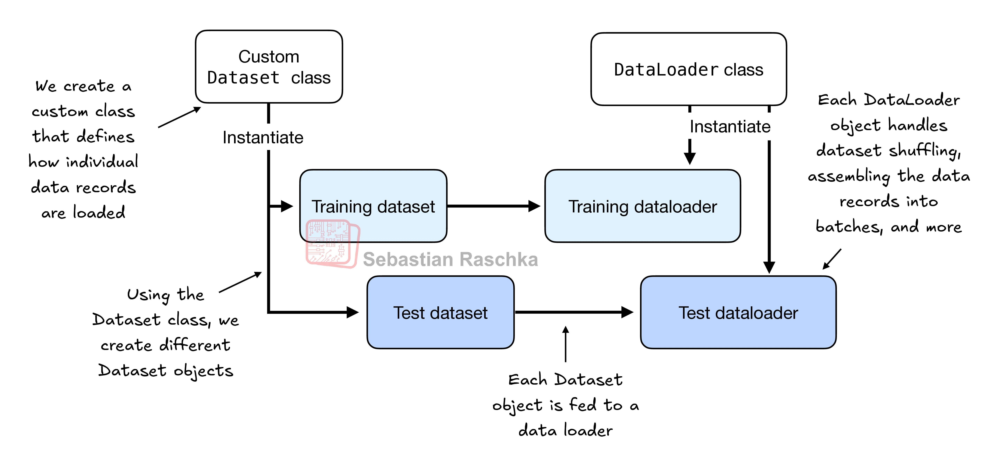


In [95]:
import torch
from torch.utils.data import DataLoader

torch.manual_seed(123)


#The batch_size argument in PyTorch's DataLoader specifies the maximum number of samples that should be included in each batch.
#It does not specify the total number of batches, nor does it guarantee that every batch will have that exact size.
#if the total number of samples in your dataset is not perfectly divisible by the batch_size, 
#the last batch will contain fewer samples than the specified batch_size. This is a "partial batch."
train_loader = DataLoader(
    dataset=train_ds,
    batch_size=2,
    shuffle=True,
    num_workers=0
)

test_ds = ToyDataset(X_test, y_test)

test_loader = DataLoader(
    dataset=test_ds,
    batch_size=2,
    shuffle=False,
    num_workers=0
)

for idx, (x, y) in enumerate(train_loader):
    print(f"Batch {idx+1}:", x, y)

Batch 1: tensor([[ 2.3000, -1.1000],
        [-0.9000,  2.9000]]) tensor([1, 0])
Batch 2: tensor([[-1.2000,  3.1000],
        [-0.5000,  2.6000]]) tensor([0, 0])
Batch 3: tensor([[ 2.7000, -1.5000]]) tensor([1])


## Training Loop

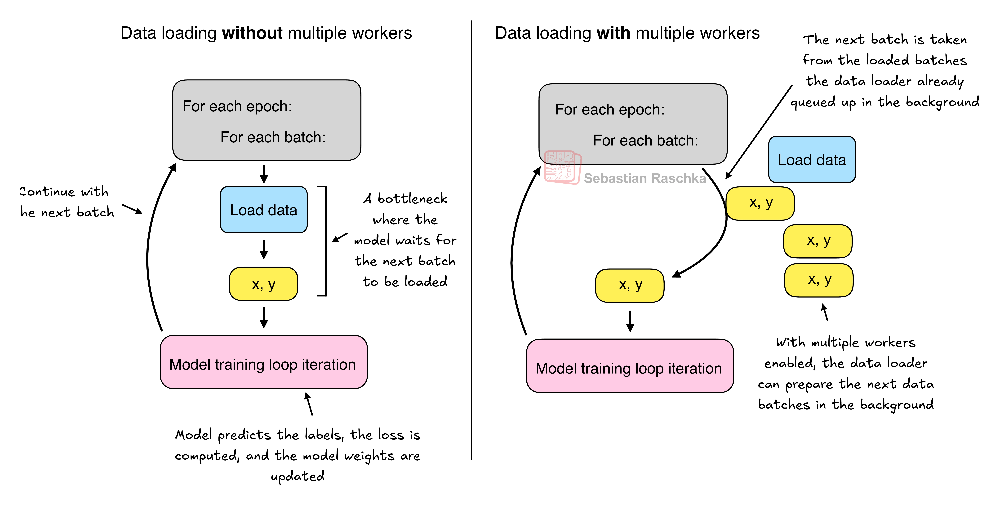

In [106]:
import torch
import torch.nn.functional as F
import torch.optim as optim

# Set random seed for reproducibility
# This ensures that initial model weights and biases,
# and any subsequent random operations (like DataLoader shuffling)
# are the same every time the script is run.
torch.manual_seed(123)
print(f"--- Initialization Started ---")
print(f"Random seed set to: {torch.initial_seed()}")
print("-" * 30)

# Define the number of input features and output features for the model.
# num_input_features: Corresponds to the number of columns (features) in each input sample (e.g., 2 for your toy data).
num_input_features = 2
print(f"Number of input features for the model defined as: {num_input_features}")

# num_output_features: Corresponds to the number of classes for classification.
# For binary classification (labels 0 and 1) using F.cross_entropy, it should be 2.
num_output_features = 2
print(f"Number of output features (classes) for the model defined as: {num_output_features}")
print("-" * 30)

# Instantiate the MultiLayerPerceptron model
# This creates an instance of your neural network class.
# When the model is created, its layers (nn.Linear) automatically
# initialize their weights and biases with random values (e.g., Kaiming Uniform).
model = MultiLayerPerceptron(num_input_features, num_output_features)
print(f"Model '{model.__class__.__name__}' instantiated.")
print(f"Model structure:\n{model}")
print("\nInitial trainable parameters (weights and biases) of the model:")
# model.parameters() is a generator that yields all nn.Parameter objects in the model.
for name, param in model.named_parameters():
    print(f"  Parameter: {name}, Shape: {param.shape}, Requires Grad: {param.requires_grad}")
    # Print the actual initial values for a few parameters (e.g., first layer weight and bias)
    if 'layers.0.weight' in name:
        print(f"    Initial values (first few): {param.data.flatten()[:5].tolist()}...")
    if 'layers.0.bias' in name:
        print(f"    Initial values: {param.data.tolist()}")
print("-" * 30)


# Define the optimizer
# The optimizer is responsible for updating the model's parameters during training.
# optim.SGD (Stochastic Gradient Descent) is a common choice.
# model.parameters(): This crucial call returns an iterable of all the model's trainable parameters.
#                     The optimizer needs to know *which* tensors it should optimize.
# lr (learning_rate): Controls the step size at which the optimizer updates the parameters.
#                     A smaller LR means smaller steps, a larger LR means larger steps.
optimizer = optim.SGD(model.parameters() , lr=0.5)
print(f"Optimizer '{optimizer.__class__.__name__}' instantiated.")
print(f"Learning Rate (lr) set to: {optimizer.defaults['lr']}")
print("-" * 30)

# Define the number of training epochs
# An epoch represents one complete pass through the entire training dataset.
# The model will iterate over all batches in train_loader 'num_epochs' times.
num_epochs = 3
print(f"Number of training epochs defined as: {num_epochs}")
print(f"--- Initialization Complete ---\n")


for epoch in range(num_epochs):
    # Set model in training mode
    model.train() # Ensures layers like Dropout and BatchNorm behave for training.

    # Loop through batches in the data-loader
    for batch_index, (features, labels) in enumerate(train_loader):
        # Let's trace one example for Batch 1, Epoch 1:
        # Assuming features = tensor([[-1.2, 3.1], [-0.9, 2.9]])
        # Assuming labels = tensor([0, 0])

        # 1. Pass the features of the batch to model (FORWARD PASS)
        # What happens:
        #    - The `features` tensor (e.g., shape [2, 2]) is fed into the `model` instance.
        #    - PyTorch internally calls `model.forward(features)`.
        #    - Data flows sequentially through `model.layers`:
        #        - `nn.Linear(2, 30)`: Performs matrix multiplication (`features @ W1.T + b1`)
        #          Output is a tensor of shape [2, 30]. This is the pre-activation for the first hidden layer.
        #        - `nn.ReLU()`: Applies `max(0, x)` element-wise to the 30-dimensional output of the first linear layer.
        #          Output shape remains [2, 30]. This is the activation of the first hidden layer.
        #        - `nn.Linear(30, 20)`: Performs (`ReLU_output @ W2.T + b2`).
        #          Output is a tensor of shape [2, 20]. Pre-activation for the second hidden layer.
        #        - `nn.ReLU()`: Applies `max(0, x)` element-wise.
        #          Output shape remains [2, 20]. Activation of the second hidden layer.
        #        - `nn.Linear(20, 2)`: Performs (`ReLU_output @ W3.T + b3`).
        #          Output is a tensor of shape [2, 2]. These are the raw **logits** for each class.
        #    - **Autograd's role:** As each operation occurs, PyTorch's Autograd engine records the operation
        #      and creates a `grad_fn` (e.g., `AddmmBackward0`, `ReluBackward0`) linked to the resulting tensor.
        #      This builds the dynamic computational graph, which is essential for backpropagation.
        # Output: `logits` tensor (e.g., `tensor([[0.1, 0.9], [0.8, 0.2]], grad_fn=<AddmmBackward0>)`)
        logits = model(features)


        # 2. Compute loss (cost/error)
        #    loss = F.cross_entropy(logits, labels)
        # What happens:
        #    - `F.cross_entropy` takes the raw `logits` (e.g., [2, 2]) and the `labels` (e.g., [2]).
        #    - Internally, it applies a Softmax function to the `logits` to convert them into probabilities for each class.
        #      (e.g., `softmax([[0.1, 0.9], [0.8, 0.2]])` -> `[[0.47, 0.53], [0.68, 0.32]]`).
        #    - Then, it calculates the Negative Log Likelihood (NLL) between these predicted probabilities and the
        #      true `labels`. This quantifies how "wrong" the model's predictions are.
        #    - The resulting `loss` is a single scalar tensor (e.g., `tensor(0.75, grad_fn=<NllLossBackward0>)`).
        #    - Autograd continues to track this operation, so `loss` also has a `grad_fn`.
        loss = F.cross_entropy(logits, labels)


        # 3. Zero the accumulated gradients
        #    optimizer.zero_grad()
        # What happens:
        #    - Gradients in PyTorch accumulate by default (`.grad` attribute adds to existing values).
        #    - This line iterates through all the trainable parameters of the model (weights and biases),
        #      and sets their `.grad` attributes to `None` or a zero tensor.
        #    - This is crucial to prevent gradients from previous batches from interfering with the
        #      gradient calculation for the current batch.
        optimizer.zero_grad()


        # 4. Backward propagation of loss (BACKWARD PASS)
        #    loss.backward()
        # What happens:
        #    - This is the magic of Autograd! PyTorch starts from the `loss` tensor.
        #    - Using the `grad_fn` chain built during the forward pass, it traverses the computational graph
        #      backwards, applying the chain rule of calculus.
        #    - For each operation, it computes the gradient of the `loss` with respect to the inputs of that operation.
        #    - These gradients are then stored in the `.grad` attribute of the corresponding `nn.Parameter` tensors
        #      (e.g., `model.layers[0].weight.grad`, `model.layers[0].bias.grad`, etc.).
        #    - The `grad` attributes are now populated with non-zero values (unless the gradient is truly zero).
        loss.backward()


        # 5. Apply the updated parameters (OPTIMIZER STEP)
        #    optimizer.step()
        # What happens:
        #    - The `optimizer` now uses the gradients stored in the `.grad` attributes.
        #    - It iterates through all the model's trainable parameters.
        #    - For each parameter, it applies the optimization algorithm's update rule.
        #      For SGD, the rule is typically: `param = param - learning_rate * param.grad`.
        #    - This modifies the actual numerical values of the model's weights and biases,
        #      making the model slightly better at predicting the current batch's labels.
        optimizer.step()


        # 6. Logging
        #    print(f"Epoch: {epoch+1:03d}/{num_epochs:03d}" ...)
        # What happens:
        #    - The current epoch number, batch index, total batches, and the `loss` value (converted to a Python scalar
        #      using `.item()`) are printed to the console for monitoring training progress.
        print(f"Epoch: {epoch+1:03d}/{num_epochs:03d}"
              f" | Batch {batch_index+1:03d}/{len(train_loader):03d}"
              f" | Train/Val loss: {loss:.2f}")

# 7. Model Evaluation Mode (Incorrect Placement)
model.eval()
# What happens:
#    - This line sets the model to evaluation mode. this disables
#      dropout and sets Batch Normalization layers to use their accumulated running statistics.
#    - **Important:** Placing `model.eval()` inside the inner loop is incorrect. You should set
#      the model to `eval()` mode *once* after all training batches for an epoch are complete,
#      typically right before you run your validation or test loop.
#      It should be outside the `for batch_index` loop, but inside the `for epoch` loop.
#      If left here, it would constantly switch modes, which is inefficient and wrong.

with torch.no_grad():
    predictions = model(X_train)

print(f"inference output for X_train is: ", predictions)

# save model to local directory
torch.save(model.state_dict(), "model.pth")


--- Initialization Started ---
Random seed set to: 123
------------------------------
Number of input features for the model defined as: 2
Number of output features (classes) for the model defined as: 2
------------------------------
Model 'MultiLayerPerceptron' instantiated.
Model structure:
MultiLayerPerceptron(
  (layers): Sequential(
    (0): Linear(in_features=2, out_features=30, bias=True)
    (1): ReLU()
    (2): Linear(in_features=30, out_features=20, bias=True)
    (3): ReLU()
    (4): Linear(in_features=20, out_features=2, bias=True)
  )
)

Initial trainable parameters (weights and biases) of the model:
  Parameter: layers.0.weight, Shape: torch.Size([30, 2]), Requires Grad: True
    Initial values (first few): [-0.2883412539958954, 0.0234226044267416, -0.35119062662124634, 0.26665955781936646, -0.6024938821792603]...
  Parameter: layers.0.bias, Shape: torch.Size([30]), Requires Grad: True
    Initial values: [0.11153016984462738, 0.5842622518539429, -0.6682156920433044, -0.4

## Analysis on Epoch outputs

Based on the training loss values, the loss is decreasing, from epoch to epoch. 
This indicates that our model is learning and converging well on the training data.

Let's look at the trend:

- Epoch 1:
  - Batch 1: 0.75
  - Batch 2: 0.65
  - Batch 3: 0.42
  - Overall trend for `Epoch 1`: Decreasing within the epoch.

<br>

- Epoch 2:
  - Batch 1: 0.05
  - Batch 2: 0.13  <-- Small increase here, but overall much lower than Epoch 1.
  - Batch 3: 0.00
  - Overall trend for `Epoch 2`: The average loss is significantly lower than Epoch 1. The slight increase in Batch 2 could be due to the random shuffle presenting a "harder" sample in that batch, or just normal fluctuation.

<br>

- Epoch 3:
  - Batch 1: 0.01
  - Batch 2: 0.00
  - Batch 3: 0.02
  - Overall trend for `Epoch 3`: The average loss is even lower than Epoch 2, approaching zero.


### Key Inferences:

 1. **Model is Learning:** The overall decrease in loss across epochs (from ~0.75 to ~0.02) strongly suggests that your model is successfully learning to map the input features to the correct output labels.

 2. **Convergence:** The loss values are getting very close to zero, which means the model is achieving very high accuracy on the training data.

 3. **No Sign of Overfitting (from training loss alone):** While the training loss is very low, this output alone doesn't tell you if the model is overfitting. To determine overfitting, you would need to also observe the validation loss or test loss. If the training loss continues to drop while the validation/test loss starts to increase, then you have overfitting.

 4. **Batch Fluctuation is Normal:** It's normal to see slight increases in loss for individual batches within an epoch (like Batch 2 of Epoch 2 increasing from 0.05 to 0.13). This is because shuffle=True means the model sees different combinations of data in each batch, and some batches might be "harder" to classify than others. As long as the overall trend for the epoch (and across epochs) is decreasing, it's a good sign.

So, in conclusion, the logs indicate that model is performing very well on the training data and learning effectively.

In [117]:
# Load the model and run inference

model = MultiLayerPerceptron(2,2)
model.load_state_dict(torch.load("model.pth", weights_only=True))

# mark model to eval state
model.eval()

# call inference on input feature dataset
total_test_loss = 0
correct_predictions = 0
total_samples = 0

with torch.no_grad(): # Essential for inference
    for test_features_batch, test_labels_batch in test_loader:
        # 1. Forward pass
        test_logits_batch = model(test_features_batch)

        # 2. Calculate loss (optional for pure inference, but good for reporting)
        loss = F.cross_entropy(test_logits_batch, test_labels_batch)
        total_test_loss += loss.item()

        # 3. Get predicted labels
        _, predicted_labels_batch = torch.max(test_logits_batch, dim=1)

        # 4. Accumulate correct predictions and total samples
        correct_predictions += (predicted_labels_batch == test_labels_batch).sum().item()
        total_samples += test_labels_batch.size(0) # or test_features_batch.size(0)

# 5. Calculate overall metrics
avg_test_loss = total_test_loss / len(test_loader)
accuracy = correct_predictions / total_samples

print(f"\n--- Inference Results ---")
print(f"Average Test Loss: {avg_test_loss:.4f}")
print(f"Overall Test Accuracy: {accuracy:.4f}")



--- Inference Results ---
Average Test Loss: 0.0044
Overall Test Accuracy: 1.0000
